In [75]:
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import SGDRegressor
from sklearn.model_selection import KFold, cross_val_score, train_test_split,StratifiedKFold # Model evaluation
from sklearn.preprocessing import LabelEncoder, RobustScaler, OneHotEncoder, StandardScaler # Preprocessing
from sklearn.linear_model import Lasso, Ridge, ElasticNet,  LassoLarsIC, RANSACRegressor, SGDRegressor, HuberRegressor, BayesianRidge # Linear models
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, AdaBoostRegressor, GradientBoostingRegressor, ExtraTreesRegressor  # Ensemble methods
from xgboost import XGBRegressor, plot_importance # XGBoost
from sklearn.svm import SVR, SVC, LinearSVC  # Support Vector Regression
from sklearn.tree import DecisionTreeRegressor # Decision Tree Regression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline, make_pipeline # Streaming pipelines
from sklearn.decomposition import KernelPCA, PCA # Dimensionality reduction
from sklearn.feature_selection import SelectFromModel # Dimensionality reduction
from sklearn.model_selection import learning_curve, validation_curve, GridSearchCV # Model evaluation
from sklearn.base import clone, BaseEstimator, TransformerMixin, RegressorMixin # Clone estimator
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import explained_variance_score, roc_auc_score, median_absolute_error, r2_score, mean_squared_error #To evaluate our model
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, fbeta_score #To evaluate our model
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor, LGBMClassifier
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split 
import pandas_profiling

In [8]:
# def gini(a,b,col):
#     df = pd.concat([pd.DataFrame({"vals":a,"key":0}),pd.DataFrame({"vals":b,"key":0})])
#     ndf = df.merge(train, on=col)
#     ndf.groupby([col])
#     group1_inpurity = 2* len([x for x in group1 if x == 0])/len(group1) * len([x for x in group1 if x == 1])/len(group1)
#     group2_inpurity = 2* len([x for x in group2 if x == 0])/len(group2) * len([x for x in group2 if x == 1])/len(group2)
    
# def gini(a,b,col):
#     group1 = []
#     group2 = []
#     train.apply(lambda x: group1.append(x.target) if x["cat0"] in a else group2.append(x.target))
    
#     group1_inpurity = 2* len([x for x in group1 if x == 0])/len(group1) * len([x for x in group1 if x == 1])/len(group1)
#     group2_inpurity = 2* len([x for x in group2 if x == 0])/len(group2) * len([x for x in group2 if x == 1])/len(group2)
    
    

In [68]:
train = pd.read_csv("../input/train.csv")
test = pd.read_csv("../input/test.csv")
testID = test.id
categorical_cols = train.select_dtypes("object").columns
y = train.target


features = pd.concat([train.drop(["target"],axis=1)  ,test])
features = pd.get_dummies(features)
train = features[:len(y)]
test = features[len(y):]
train = train.drop(["id"],axis=1)
test = test.drop(["id"],axis=1)

In [76]:
pandas_profiling.ProfileReport(pd.read_csv("../input/train.csv"))

Summarize dataset:   0%|          | 0/45 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df = pd.concat([train,y],axis=1)

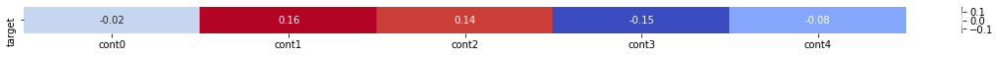

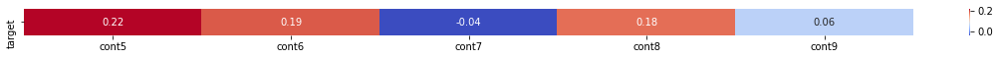

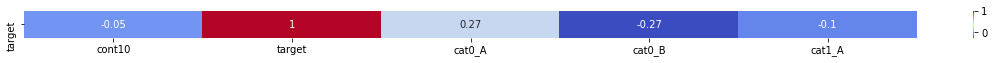

In [27]:
from math import ceil
correlation_matrix = train.corr().round(2)
matrix = correlation_matrix.loc[["target"]]
for x in range(ceil((len(train.columns)-5)/5)):
    plt.figure(x,figsize = (20,.5))
    sns.heatmap(data=matrix.iloc[:,x*5:min(len(train),(x+1)*5)], cmap="coolwarm",annot=True)

In [28]:
matrix

,cont0,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,...,cat16_C,cat16_D,cat17_A,cat17_B,cat17_C,cat17_D,cat18_A,cat18_B,cat18_C,cat18_D
target,-0.02,0.16,0.14,-0.15,-0.08,0.22,0.19,-0.04,0.18,0.06,...,-0.0,-0.51,-0.01,0.13,0.24,-0.27,-0.01,-0.41,0.26,0.3


In [38]:
print("Best Fourth:",np.quantile(abs(correlation_matrix["target"]), .75))

Best Fourth: 0.03


In [46]:
x = correlation_matrix["target"][abs(correlation_matrix["target"])>=.03]

In [49]:
correlation_matrix.to_csv("../output/correlation_matrix.csv")

In [ ]:
x = x.drop(["target"])

In [71]:
train = train[x.index]
test = test[x.index]

In [60]:
params={'metric': 'auc', 'reg_alpha': 6.010538011450937, 'reg_lambda': 0.031702113663443346, 'colsample_bytree': 0.27,
   'subsample': 0.6, 'learning_rate': 0.05, 'max_depth': 100, 'num_leaves': 100, 'min_child_samples': 216,
   'cat_smooth': 87, 'random_state': 48,'n_estimators': 20000}
preds = np.zeros(test.shape[0])        
kf = StratifiedKFold(n_splits=5,random_state=48,shuffle=True) #As we can see the data is unbalanced that's why I'll use StratifiedKFold to split data: Don't want all zeros in a split                 
auc=[]   # list contains AUC for each fold  
n=0   
for trn_idx, test_idx in kf.split(train,y):
    X_tr,X_val=train.iloc[trn_idx],train.iloc[test_idx]
    y_tr,y_val=y.iloc[trn_idx],y.iloc[test_idx]
    model = LGBMClassifier(**params) 
    model.fit(X_tr,y_tr,eval_set=[(X_val,y_val)],early_stopping_rounds=100,verbose=False) 
    auc.append(roc_auc_score(y_val, model.predict_proba(X_val)[:, 1])) 
    print(n+1,auc[n])                                                                                       
    n+=1    

1 0.8934802126651991
2 0.8951459336441905
3 0.8931215938495336
4 0.8948946926167154
5 0.8952202546300666


In [61]:
from catboost import CatBoostClassifier

In [72]:
params={}
preds = np.zeros(test.shape[0])        
kf = StratifiedKFold(n_splits=5,random_state=48,shuffle=True) #As we can see the data is unbalanced that's why I'll use StratifiedKFold to split data: Don't want all zeros in a split                 
auc=[]   # list contains AUC for each fold  
n=0   
for trn_idx, test_idx in kf.split(train,y):
    X_tr,X_val=train.iloc[trn_idx],train.iloc[test_idx]
    y_tr,y_val=y.iloc[trn_idx],y.iloc[test_idx]
    model = CatBoostClassifier(**params) 
    model.fit(X_tr,y_tr,eval_set=[(X_val,y_val)],early_stopping_rounds=100,verbose=False) 
    preds+=model.predict_proba(test)[:, 1]/kf.n_splits
    auc.append(roc_auc_score(y_val, model.predict_proba(X_val)[:, 1])) 
    print(n+1,auc[n])                                                                                       
    n+=1    

1 0.8921665695128889
2 0.8935419818562639
3 0.8920004954431805
4 0.8932724802706653
5 0.8940054328765614


In [73]:
sub = pd.DataFrame({"id":testID,"target":preds})
sub.to_csv("../output/catboost.csv",index=False)